In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import matplotlib.pyplot as plt
np.set_printoptions(precision=2, linewidth=150)

In [2]:
flag_totals = False # print summary statistics for groups of numbers
flag_elements = False # print groups of nnumbers
with open("../data/xyie_data/1K0Slice_Integratedpm0p1.xyie") as fd: 
    count = 0 
    for line in fd: 
        if len(line) > 30: 
            line_elements = line.strip().split()
            if flag_totals:
                print("Element Count:", len(line_elements)) 
            if flag_elements:
                elements = np.array(line_elements, dtype=np.float128)
                elements = np.hstack([elements, [0,0]]).reshape((6,10))
                print(elements,end="\n\n")
            count += 1; 
    if flag_totals:
        print("total:",count) 

In [4]:
!pwd

/Users/jamesshaddix/Documents/Pro/Git/Repos/Neutron-Scattering-Dashboard/plots


In [5]:
df = pd.read_csv("../data/1K0Slice_Integratedpm0p1.csv",names=["x","y","z"])
df.shape

(36461, 3)

In [6]:
df.head()

,x,y,z
0,-1.7929,0.002324,10.0610
1,-1.7851,0.002324,10.3220
2,-1.7748,0.002324,9.8859
3,-1.7652,0.002324,9.6727
4,-1.7552,0.002324,9.5339


In [7]:
df.tail()

,x,y,z
36456,1.7640,0.99742,0.0
36457,1.7738,0.99742,0.0
36458,1.7837,0.99742,0.0
36459,1.7932,0.99742,0.0
36460,1.8024,0.99742,0.0


In [8]:
print("unique z: ",df.z.unique().size)
print("unique x: ",df.x.unique().size)
print("unique y: ",df.y.unique().size)

unique z:  26894
unique x:  361
unique y:  101


### Data Cross Sections

In [9]:
y_sorted = sorted(df.y.unique())

In [10]:
y_sorted[0],y_sorted[1]

(0.0023244, 0.010074)

* plots smallest y-values

In [11]:

#for i in range(21):
#    plt.plot(df.z[df.y == y_sorted[i]]);
#    plt.title(f"Smallest Y Value: {i+1}")
#    plt.show()

* y-data

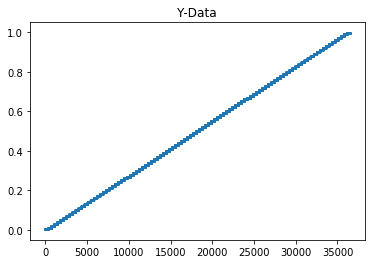

In [12]:
%matplotlib inline
plt.scatter(range(len(df.y)), df.y, s=1, marker='o');
plt.title("Y-Data");

* x vs. y data

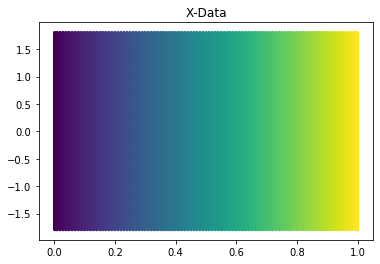

In [13]:
%matplotlib inline
plt.scatter(df.y,
            df.x, 
            s=5,
            c=np.arange(len(df.x)) // len(df.x.unique()), 
            marker='o');
plt.title("X-Data");

* z-data

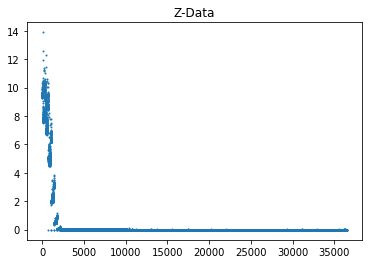

In [14]:
plt.scatter(range(len(df.z)), df.z,s=1)
plt.title("Z-Data");

# Plots

#### Scatter

In [15]:
x_unique = df.x.unique()
y_unique = df.y.unique()

In [16]:
data = [go.Scatter3d(x=df.x, y=df.y, z=df.z,
                     mode="markers",
                     marker = dict(
                         color = '#FFBAD2',
                         line = dict(width = 0.01)
                     )
                    )]

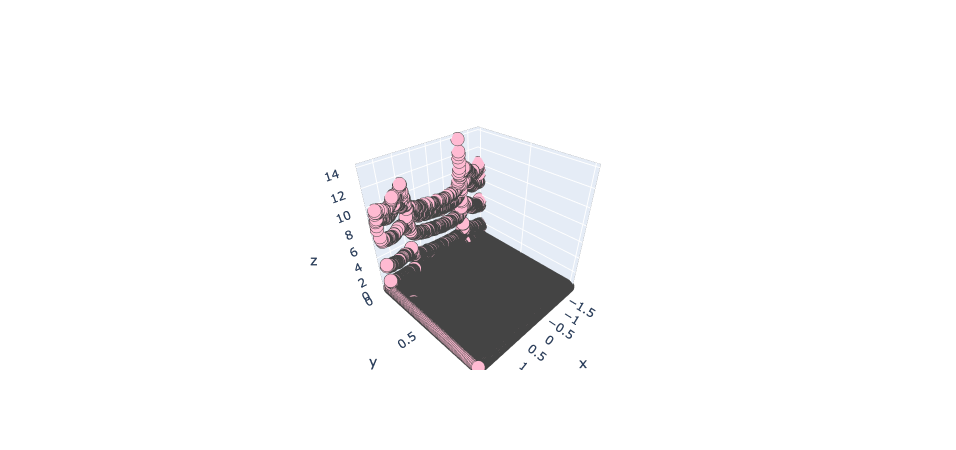

In [17]:
fig = go.Figure(data)
fig.show()

### Heat Map

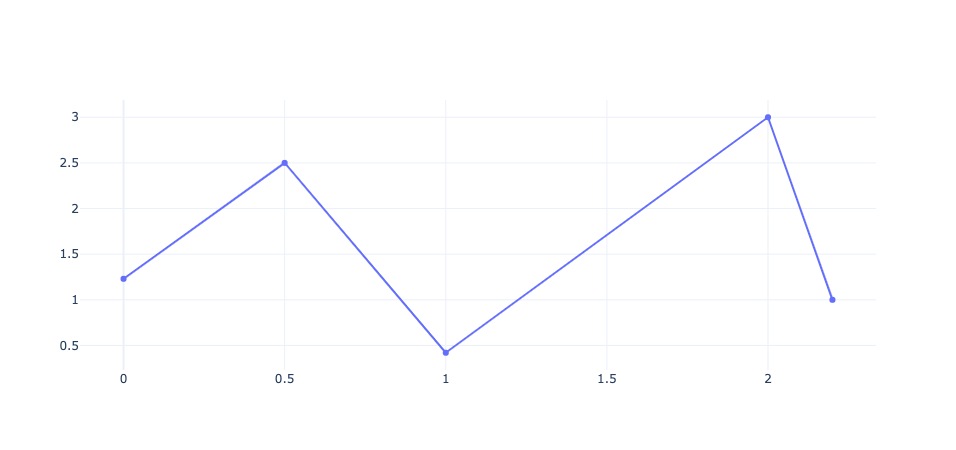

In [18]:
# Create figure
fig = go.Figure()

# Add trace
fig.add_trace(
    go.Scatter(x=[0, 0.5, 1, 2, 2.2], y=[1.23, 2.5, 0.42, 3, 1])
)

# Add images
fig.update_layout(
    images=[
        go.layout.Image(
            #source="https://images.plot.ly/language-icons/api-home/python-logo.png",
            source="no-bar.png",
            xref="x",
            yref="y",
            x=0,
            y=3,
            sizex=2,
            sizey=2,
            sizing="stretch",
            opacity=0.5,
            layer="below")
    ]
)

# Set templates
fig.update_layout(template="plotly_white")

fig.show()

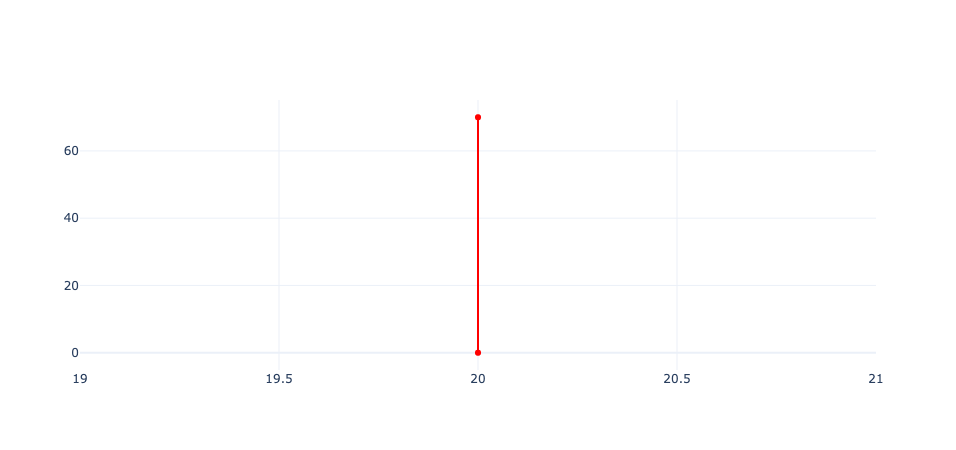

In [19]:
trace = go.Scatter(x=[20,20],y=[0,70], marker={"color":"red"})
data = [trace]
line_fig = go.Figure()
line_fig.add_trace(trace)

# Add images
line_fig.update_layout(
    images=[
        go.layout.Image(
            source="no-bar.png",
            xref="x",
            yref="y",
            x=0,
            y=3,
            sizex=2,
            sizey=2,
            sizing="stretch",
            opacity=0.5,
            layer="below")
    ]
)

    # Set templates
line_fig.update_layout(template="plotly_white")


line_fig.show()

In [20]:
# set the background
#df.z[df.z == -1] = -5

In [21]:
#df.z[df.z = 0] = -0.2

In [22]:
df.z.max()

13.897

* Creating a New Z value to test things out

In [23]:
new_z = df.z.copy()

* removing data below the v-shapes

In [24]:
#new_df = df[df.y > (sorted(df.y.unique())[5])]

* constraining the colormap

In [25]:
# adding a minimum value
new_z.loc[new_z < 0] = 0

# adding a maximum value (0.057 tends to work (eliminates 3-actual values))
# - here I am going to put a much smaller thresold value
max_val = 0.025
new_z.loc[new_z > max_val] = max_val

In [26]:
new_z.sort_values(ascending=False).head(20)

0       0.025
1686    0.025
1678    0.025
1679    0.025
1680    0.025
1681    0.025
1682    0.025
1683    0.025
1684    0.025
1685    0.025
1687    0.025
1697    0.025
1688    0.025
1689    0.025
1690    0.025
1691    0.025
1692    0.025
1693    0.025
1694    0.025
1695    0.025
Name: z, dtype: float64

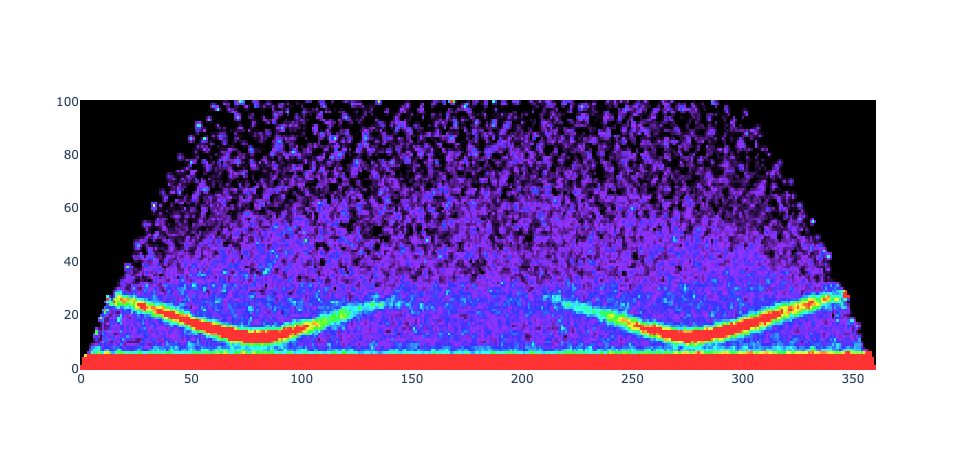

In [27]:
heat_trace = go.Heatmap(
    z=np.array(new_z).reshape(-1, (len(df.x.unique()))),

    colorscale= [
        
        [0, 'rgb(0, 0, 0)'], # black
                 
        [0.1, 'rgb(153, 51, 255)'], # purple

        [0.2, 'rgb(51, 51, 255)'],  # blue
                 
        [0.3, 'rgb(51, 153, 255)'], # light blue
                 
        [0.4, 'rgb(51, 255, 255)'], # teal

        [0.5, 'rgb(51, 255, 153)'], # light green

        [0.6, 'rgb(51, 255, 51)'],  # green

        [0.7, 'rgb(153, 255, 51)'], # yellow green

        [0.8, 'rgb(255, 255, 51)'], # yellow
                 
        [0.9, 'rgb(255, 153, 51)'], # orange
                 
        [1, 'rgb(255, 51, 51)']
    ],
    showscale=False #showing colorbar
)

line_trace = go.Scatter(x=[20,20],y=[0,len(df.y.unique())-1], marker={"color":"red"})
#data=[heat_trace,line_trace]
data=[heat_trace]
heat_fig = go.Figure(data)
heat_fig.show()

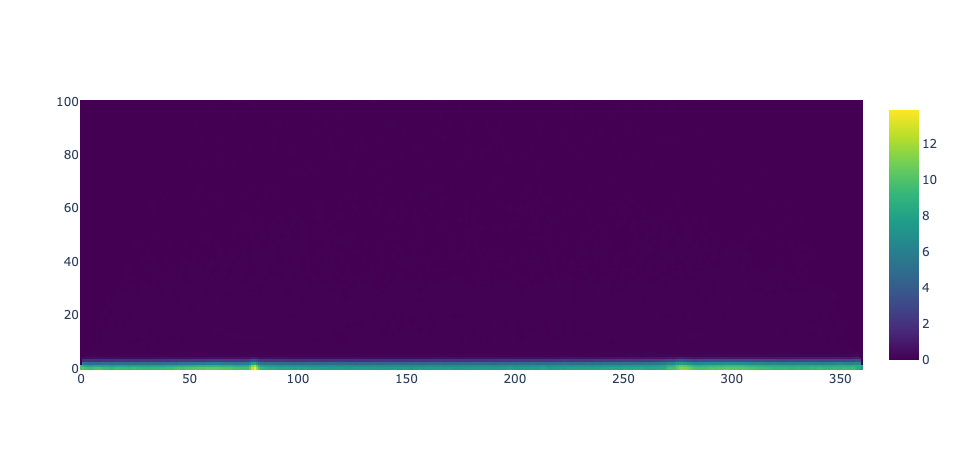

In [28]:
heat_trace = go.Heatmap(
    z=np.array(df.z).reshape(-1, (len(df.x.unique()))),
    colorscale='Viridis',
    #showscale=False
)
data=[heat_trace]
#py.iplot(go.Figure(data,layout=go.Layout(paper_bgcolor="#5B5B5B")))
new_fig = go.Figure(data)
new_fig.show()

### Surface Plot

In [29]:
x_unique = df.x.unique()
y_unique = df.y.unique()
len(x_unique), len(y_unique)

(361, 101)

In [30]:
(len(x_unique)-1)//10

36

In [31]:
np.cumsum(np.full((1, (len(x_unique)-1)//10), 10))

array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280,
       290, 300, 310, 320, 330, 340, 350, 360])

In [32]:
X, Y = np.meshgrid(x_unique,y_unique)
X.shape, Y.shape

((101, 361), (101, 361))

In [33]:
Z = np.array(df.z).reshape((len(y_unique), len(x_unique)))

In [34]:
data = [go.Surface(x=X, y=Y, z=Z)]

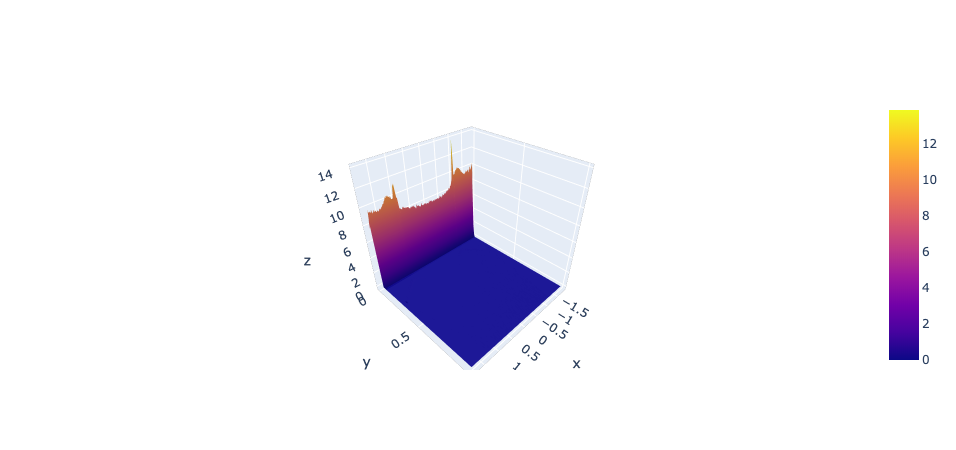

In [35]:
surface_fig = go.Figure(data)
surface_fig.show()

### Trying New Stuff

In [36]:
colorscale= [
        
        [0, 'rgb(0, 0, 0)'], # black
                 
        [0.1, 'rgb(153, 51, 255)'], # purple

        [0.2, 'rgb(51, 51, 255)'],  # blue
                 
        [0.3, 'rgb(51, 153, 255)'], # light blue
                 
        [0.4, 'rgb(51, 255, 255)'], # teal

        [0.5, 'rgb(51, 255, 153)'], # light green

        [0.6, 'rgb(51, 255, 51)'],  # green

        [0.7, 'rgb(153, 255, 51)'], # yellow green

        [0.8, 'rgb(255, 255, 51)'], # yellow
                 
        [0.9, 'rgb(255, 153, 51)'], # orange
                 
        [1, 'rgb(255, 51, 51)']
    ]

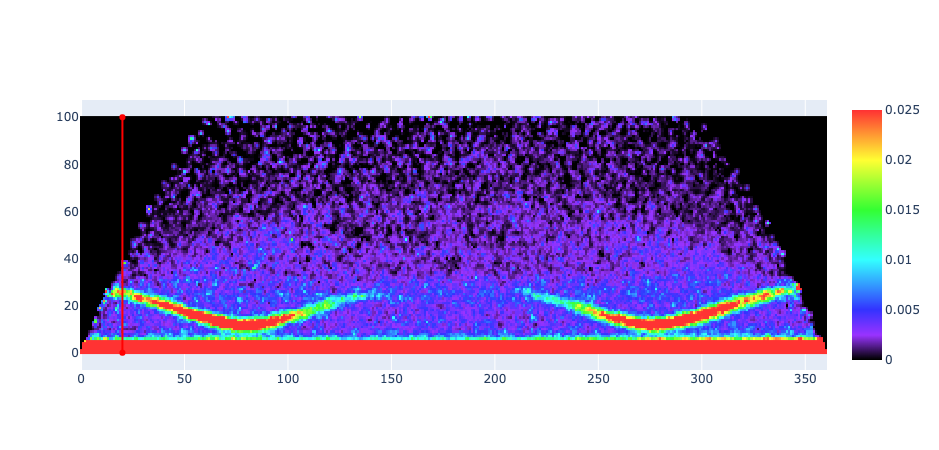

In [40]:
heat_trace = go.Heatmap(
    z=np.array(new_z).reshape(-1, (len(df.x.unique()))),

    colorscale=colorscale,
    showscale=True #showing colorbar
)

line_trace = go.Scatter(x=[20,20],y=[0,len(df.y.unique())-1], marker={"color":"red"})
#data=[heat_trace,line_trace]
data=[heat_trace,line_trace]
heat_fig = go.Figure(data)
heat_fig.show()

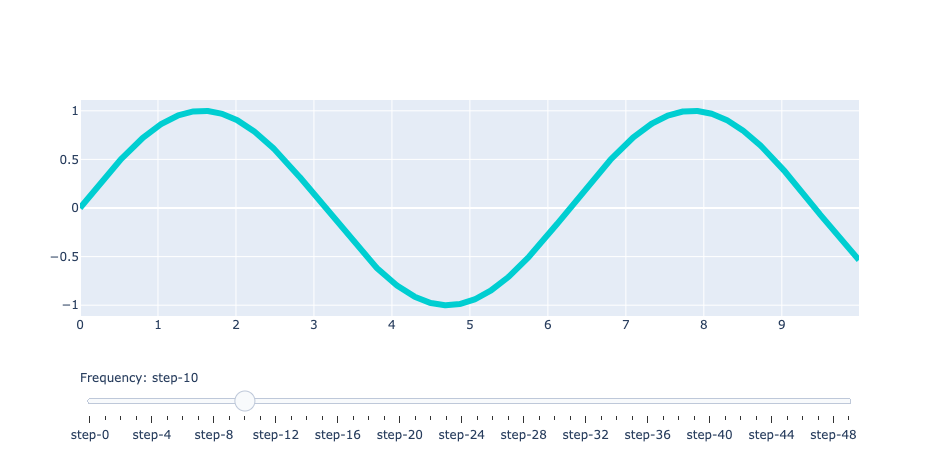

In [39]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="restyle",
        args=["visible", [False] * len(fig.data)],
    )
    step["args"][1][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="restyle",
        args=["visible", [False] * len(fig.data)],
    )
    step["args"][1][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [41]:
fig = go.Figure()

In [52]:
trace = go.Scatter(x=[20,20],y=[0,70], marker={"color":"red"},
                  xaxis=go.Layout.XAxis(title="cool"))
fig.add_trace(trace)
fig.show()

AttributeError: type object 'Layout' has no attribute 'XAxis'